# **Preparation Data**

## Resize data ke ukuran 640px

In [1]:
from PIL import Image
import os

input_folder = 'dataset_mentah/images'
output_folder = 'dataset_mentah/resize'

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

size = 640

for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_folder, filename)
        img = Image.open(img_path)

        img.thumbnail((size, size), Image.Resampling.LANCZOS)

        new_img = Image.new('RGB', (size, size), (255, 255, 255))

        paste_x = (size - img.width) // 2
        paste_y = (size - img.height) // 2

        new_img.paste(img, (paste_x, paste_y))

        new_img.save(os.path.join(output_folder, filename))

print("All images have been resized and saved to the output folder.")

All images have been resized and saved to the output folder.


## Labeling menggunakan labelimg

## Anotasi Citra dari .xml ke .txt

In [37]:
!python xml2txt.py --annotations_path dataset_mentah/annotations --labels_path dataset_mentah/labels --classes "Nasi=0,Tempe=1,Sambel=2,Mie=3,Sayur_kol=4,Tempe_orek=5,Telur_ceplok=6,Telur_ceplok_sambel=7,Telur_bulat_sambel=8,Tumis_oncom_cepokak=9,Sayur_timun=10,Gorengan=11,Sambel_tempe=12,Sayur_bayam=13,Telur_dadar=14, Rawon=15,Kerang=16,Tumis_toge=17,Ikan_kembung=18,Sayur_daun_singkong=19,Ayam_sambel=20,Sambel_terong=21,Kikil=22,Tumis_tempe_cepokak=23,Sambel_kentang=24,Teri=25,Tumis_toge_kacang_panjang=26,Semur_jengkol=27,Capcai=28,Tumis_labu_wortel=29,Tumis_pare=30,Kwetiau=31,Tumis_kacang_panjang=32,Bergedel=33,Ikan_tongkol_sambel=34,Sayur_labu=35,Tumis_jamur=36,Sayur_sawi=37,Tumis_tempe_buncis=38,Sayur_nangka=39,Ikan_patin=40,Tumis_tempe=41,Tumis_kangkung_buncis=42,Ati_ampela=43,Ayam_kecap=44,Tumis_kangkung=45,Sayur_sawi_jagung=46,Sayur_bambu=47,Ikan_asin=48,Tumis_toge_genjer=49,Ikan_kembung_sambel=50,Tumis_jagung=51,Sayur_buncis=52,Usus=53,Sayur_tahu_kacang_panjang=54,Tumis_tahu=55,Tumis_oncom=56,Tumis_sawi=57,Ikan_patin_sambel=58,Sayur_kacang_panjang=59,Sayur_kentang=60,Ikan_patin_sayur=61,Rendang_daging=62,Kentang=63,Bihun=64,Telur_bulat=65,Tumis_buncis_wortel=66,Ayam_sayur_kentang=67,Tumis_kentang_buncis=68,Tumis_buncis=69,Tahu=70,Sayur_tempe_kentang=71,Sayur_kentang_wortel=72,Tumis_kangkung_tempe=73,Tumis_kol_bayam=74,Telur_sambel=75,Ayam_sayur=76,Sambel_tongkol_kentang=77,Telur_tempe_kecap=78,Pepes_tahu=79,Tumis_daun_pepaya=80,Tumis_bunga_pepaya=81,Tumis_tahu_terong=82,Tumis_jamur_buncis=83,Tumis_terong=84,Tumis_tempe_kacang_panjang=85,Sambel_ceker=86,Sayur_tempe=87,Sayur_tahu_toge=88,Kacang_panjang=89,Ikan_bawal=90,Tumis_toge_tahu=91,Daun_kangkung=92,Semur_telur_bulat_tempe=93,Tumis_kentang_kacang_panjang=94,Tumis_toge_wortel=95"


Converting XML to TXT: 100%|██████████| 400/400 [00:04<00:00, 96.24it/s] 


## Cek Jumlah File Sebelum Split Data

In [1]:
import os

def count_files(directory: str) -> int:
    try:
        return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])
    except Exception as e:
        print(f"Error accessing directory {directory}: {e}")
        return 0

if __name__ == '__main__':
    # Directory containing the train images
    resize = 'dataset_mentah/resize'


    # Count the number of files in the train and validation directories
    num_resize = count_files(resize)


    print(f"Number of files in train directory: {num_resize}")



Number of files in train directory: 400


## Split Data

In [39]:
!python dataset_preparation.py --data_path ./ --train_path dataset/train --valid_path dataset/val --split_ratio 0.7

Training files: 280
Validation files: 120



Copying files to dataset/train\images: 100%|██████████| 280/280 [00:02<00:00, 103.12it/s]

Copying files to dataset/train\labels: 100%|██████████| 280/280 [00:02<00:00, 117.63it/s]

Copying files to dataset/val\images: 100%|██████████| 120/120 [00:01<00:00, 90.44it/s]

Copying files to dataset/val\labels: 100%|██████████| 120/120 [00:01<00:00, 101.69it/s]


## Augmentasi Data Train

In [40]:
!python data_augmentation.py --train_path dataset/train --num_augmentations 5

data_augmentation.py:58: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(image_path)

100%|██████████| 280/280 [00:35<00:00,  7.81it/s]


## Tampil Citra Augmentasi

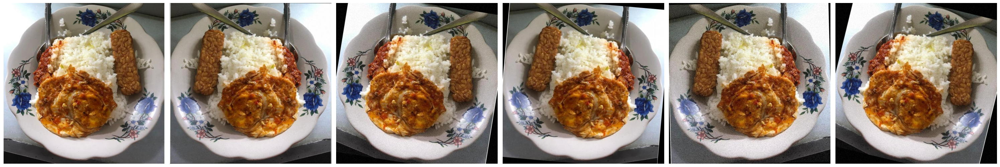

In [41]:
# Import necessary libraries
import os
import cv2
import matplotlib.pyplot as plt

# Define the directory path
directory = 'dataset/train/images'

# List all files in the directory
files = os.listdir(directory)

# Select the first 5 image paths from the directory
image_paths = [os.path.join(directory, file) for file in files[:6]]

# Define a function to load and plot images
def plotImages(image_paths):
    fig, axes = plt.subplots(1, len(image_paths), figsize=(30, 20))
    for img_path, ax in zip(image_paths, axes):
        # Load image using cv2
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB (opencv uses BGR by default)

        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Call the plotImages function to display the images
plotImages(image_paths)


# Train lr 0.001 with yolov8n

## Epoch 5

In [16]:
!python train.py --data_config data.yaml --epochs 5 --model_name yolov8n.pt --export_format onnx --onnx_path model.onnx --pt_path model.pt

New https://pypi.org/project/ultralytics/8.3.49 available 😃 Update with 'pip install -U ultralytics'
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes


train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]

val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]
        1/5         0G      2.501       5.44      2.486         92        640:   0%|          | 0/80 [00:17<?, ?it/s]
        1/5         0G      2.501       5.44      2.486         92        640:   1%|▏         | 1/80 [00:17<23:05, 17.53s/it]
        1/5         0G        2.4      5.384       2.41         88        640:   1%|▏   

## Epoch 10

In [17]:
!python train.py --data_config data.yaml --epochs 10 --model_name yolov8n.pt --export_format onnx --onnx_path model.onnx --pt_path model.pt

New https://pypi.org/project/ultralytics/8.3.49 available 😃 Update with 'pip install -U ultralytics'


train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]

val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]
       1/10         0G      2.664      5.629      2.853         52        640:   0%|          | 0/80 [00:12<?, ?it/s]
       1/10         0G      2.664      5.629      2.853         52        640:   1%|▏         | 1/80 [00:12<16:00, 12.16s/it]
       1/10         0G      2.612      5.635      2.856         44        640:   1%|▏   


engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False

## Epoch 15

In [18]:
!python train.py --data_config data.yaml --epochs 15 --model_name yolov8n.pt --export_format onnx --onnx_path model.onnx --pt_path model.pt

New https://pypi.org/project/ultralytics/8.3.49 available 😃 Update with 'pip install -U ultralytics'
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box


train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]

val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]
       1/15         0G      2.501       5.44      2.486         92        640:   0%|          | 0/80 [00:12<?, ?it/s]
       1/15         0G      2.501       5.44      2.486         92        640:   1%|▏         | 1/80 [00:12<16:47, 12.76s/it]
       1/15         0G        2.4      5.384       2.41         88        640:   1%|▏   

## Epoch 20

In [ ]:
!python train.py --data_config data.yaml --epochs 20 --model_name yolov8n.pt --export_format onnx --onnx_path model.onnx --pt_path model.pt

# Train Batch 16 lr 0.001

## Epochs 5

In [2]:
from ultralytics import YOLO
# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO('yolov8n.yaml')  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data='data.yaml',  # Path to the dataset configuration file
    epochs=5,                        # Number of epochs to train
    batch=16,
    lr0=0.001,
    lrf=0.001
)

## Epochs 10

In [23]:
from ultralytics import YOLO
# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=10,                          # Number of epochs to train
    batch=16,
    lr0=0.001,
    lrf=0.001
)

New https://pypi.org/project/ultralytics/8.3.49 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, sa

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train7\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train7
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      2.875      5.898      4.188         45        640: 100%|██████████| 80/80 [17:18<00:00, 12.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:36<00:00,  9.11s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G       2.86       5.79      4.124         38        640: 100%|██████████| 80/80 [17:30<00:00, 13.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:42<00:00, 10.65s/it]

                   all        122        374   3.83e-05    0.00472   0.000126    2.6e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      2.831      5.622       4.04         40        640: 100%|██████████| 80/80 [17:33<00:00, 13.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.09s/it]

                   all        122        374      0.215     0.0013   0.000311   7.21e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      2.824      5.378      3.951         43        640: 100%|██████████| 80/80 [15:49<00:00, 11.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:37<00:00,  9.27s/it]

                   all        122        374      0.129    0.00213    0.00039   0.000123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      2.818      5.216      3.858         41        640: 100%|██████████| 80/80 [17:33<00:00, 13.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:37<00:00,  9.29s/it]

                   all        122        374      0.129    0.00248   0.000697   0.000167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      2.809      5.092      3.767         45        640: 100%|██████████| 80/80 [18:04<00:00, 13.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:43<00:00, 10.93s/it]

                   all        122        374      0.129    0.00142    0.00106   0.000306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      2.791      5.021       3.73         49        640: 100%|██████████| 80/80 [17:11<00:00, 12.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:43<00:00, 10.79s/it]

                   all        122        374   0.000255     0.0179    0.00163   0.000552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      2.784       4.97      3.675         40        640: 100%|██████████| 80/80 [18:02<00:00, 13.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.56s/it]

                   all        122        374      0.144     0.0013    0.00094   0.000245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      2.769      4.932      3.653         40        640: 100%|██████████| 80/80 [18:18<00:00, 13.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:45<00:00, 11.49s/it]

                   all        122        374      0.215    0.00153    0.00102   0.000239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      2.763      4.917      3.631         45        640: 100%|██████████| 80/80 [16:47<00:00, 12.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:37<00:00,  9.29s/it]

                   all        122        374      0.229    0.00307    0.00144   0.000338



10 epochs completed in 3.017 hours.
Optimizer stripped from runs\detect\train7\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train7\weights\best.pt, 6.8MB

Validating runs\detect\train7\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:30<00:00,  7.63s/it]


                   all        122        374   0.000255     0.0179    0.00166   0.000554
           {0: 'Nasi'}        121        121    0.00554       0.57     0.0384     0.0125
          {1: 'Tempe'}         16         17          0          0          0          0
         {2: 'Sambel'}         10         10          0          0          0          0
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001BB55715FD0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 15

In [1]:
from ultralytics import YOLO
# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=15,                          # Number of epochs to train
    batch=16,
    lr0=0.001,
    lrf=0.001
)

Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train20, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train20\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train20
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      3.149      5.902      4.169         77        640: 100%|██████████| 80/80 [17:33<00:00, 13.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.24s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G      3.135      5.764      4.098         88        640: 100%|██████████| 80/80 [17:20<00:00, 13.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.20s/it]

                   all        122        374   4.65e-05    0.00413   5.96e-05   1.36e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G      3.122       5.51      4.007         95        640: 100%|██████████| 80/80 [18:17<00:00, 13.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.13s/it]

                   all        122        374      0.144     0.0013   0.000397    9.8e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G      3.102      5.294      3.921         67        640: 100%|██████████| 80/80 [17:29<00:00, 13.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:41<00:00, 10.50s/it]

                   all        122        374      0.101    0.00177   0.000963   0.000184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G      3.082      5.188      3.851         79        640:  46%|████▋     | 37/80 [08:59<10:26, 14.58s/it]


KeyboardInterrupt: 

In [24]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=20,                          # Number of epochs to train
    batch=16,
    lr0=0.001,
    lrf=0.001,                      # Final learning rate
    project="runs/detect/"  # Path to save training results
)

New https://pypi.org/project/ultralytics/8.3.49 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=F

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train8\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train8
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G      3.149      5.902      4.169         77        640: 100%|██████████| 80/80 [18:13<00:00, 13.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:50<00:00, 12.58s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G      3.135      5.763      4.098         88        640: 100%|██████████| 80/80 [19:06<00:00, 14.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.60s/it]

                   all        122        374   4.65e-05    0.00413   6.23e-05   1.42e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G      3.121      5.504      4.005         95        640: 100%|██████████| 80/80 [16:51<00:00, 12.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.20s/it]

                   all        122        374      0.158   0.000945   0.000397   9.62e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G        3.1      5.278      3.914         67        640: 100%|██████████| 80/80 [18:16<00:00, 13.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:44<00:00, 11.02s/it]


                   all        122        374      0.158    0.00201    0.00252   0.000383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G        3.1      5.143      3.819         80        640: 100%|██████████| 80/80 [18:25<00:00, 13.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:48<00:00, 12.01s/it]

                   all        122        374      0.172    0.00118    0.00305    0.00105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G      3.088      5.004      3.746         72        640: 100%|██████████| 80/80 [19:48<00:00, 14.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:46<00:00, 11.58s/it]

                   all        122        374   0.000653     0.0289    0.00149   0.000408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G      3.048      4.926      3.675         68        640: 100%|██████████| 80/80 [18:02<00:00, 13.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:43<00:00, 10.81s/it]

                   all        122        374      0.201      0.013   0.000911   0.000378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G      2.996      4.827      3.616         73        640: 100%|██████████| 80/80 [17:54<00:00, 13.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.91s/it]

                   all        122        374   0.000954     0.0343    0.00182   0.000366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G      2.927      4.727       3.54         96        640: 100%|██████████| 80/80 [18:47<00:00, 14.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:48<00:00, 12.23s/it]


                   all        122        374    0.00303     0.0522     0.0103    0.00303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G       2.86      4.653       3.48         67        640: 100%|██████████| 80/80 [17:04<00:00, 12.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:37<00:00,  9.39s/it]

                   all        122        374     0.0014     0.0533    0.00358    0.00107


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G       2.64      4.709      3.415         42        640: 100%|██████████| 80/80 [16:38<00:00, 12.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.78s/it]

                   all        122        374    0.00124     0.0655    0.00784    0.00247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G      2.615      4.628      3.356         41        640: 100%|██████████| 80/80 [17:46<00:00, 13.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:41<00:00, 10.26s/it]

                   all        122        374      0.362    0.00895     0.0114    0.00367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G       2.56      4.563      3.307         38        640: 100%|██████████| 80/80 [22:11<00:00, 16.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:56<00:00, 14.09s/it]

                   all        122        374    0.00253       0.11     0.0105    0.00328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G      2.541      4.516      3.278         41        640: 100%|██████████| 80/80 [21:55<00:00, 16.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:46<00:00, 11.61s/it]

                   all        122        374      0.331      0.015     0.0107    0.00377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G      2.518      4.506       3.25         42        640: 100%|██████████| 80/80 [20:41<00:00, 15.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:43<00:00, 10.90s/it]


                   all        122        374      0.405    0.00871     0.0184    0.00694

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G        2.5      4.452      3.222         45        640: 100%|██████████| 80/80 [19:29<00:00, 14.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:48<00:00, 12.24s/it]

                   all        122        374      0.434    0.00681      0.017    0.00595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G      2.505      4.425      3.212         40        640: 100%|██████████| 80/80 [17:27<00:00, 13.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.87s/it]

                   all        122        374    0.00515      0.158     0.0195    0.00679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G      2.489      4.414      3.212         46        640: 100%|██████████| 80/80 [17:18<00:00, 12.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]


                   all        122        374        0.2     0.0635     0.0217    0.00869

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G      2.487      4.402        3.2         46        640: 100%|██████████| 80/80 [17:32<00:00, 13.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]

                   all        122        374      0.182      0.102     0.0216    0.00866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G      2.472      4.384      3.196         42        640: 100%|██████████| 80/80 [17:07<00:00, 12.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.90s/it]

                   all        122        374      0.405     0.0198     0.0239    0.00911



20 epochs completed in 6.427 hours.
Optimizer stripped from runs\detect\train8\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train8\weights\best.pt, 6.8MB

Validating runs\detect\train8\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:32<00:00,  8.16s/it]


                   all        122        374      0.406     0.0198     0.0239    0.00917
           {0: 'Nasi'}        121        121     0.0856      0.438      0.191     0.0571
          {1: 'Tempe'}         16         17          1          0     0.0388     0.0166
         {2: 'Sambel'}         10         10          0          0    0.00923    0.00223
            {3: 'Mie'}          7          7          1          0    0.00217   0.000217
      {4: 'Sayur_kol'}          7          7          1          0    0.00424    0.00127
     {5: 'Tempe_orek'}          7          7          1          0    0.00474   0.000948
{7: 'Telur_ceplok_sambel'}          3          3          1          0    0.00602    0.00422
{8: 'Telur_bulat_sambel'}          7          7          1          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001BB57577A00>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

In [ ]:
from ultralytics import YOLO
# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO('yolov8n.yaml')  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data='data.yaml',  # Path to the dataset configuration file
    epochs=50,                        # Number of epochs to train
    batch=16,
    lr0=0.001,
    lrf=0.001
)

# Train Batch 16 lr 0.01

## Epochs 5

In [1]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=5,                          # Number of epochs to train
    batch=16,
    lr0=0.01,
    lrf=0.01,                      # Final learning rate
    project="runs/detect/"  # Path to save training results
)

New https://pypi.org/project/ultralytics/8.3.50 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=Fa

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train9\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train9
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         0G      3.149      5.902      4.169         77        640: 100%|██████████| 80/80 [18:30<00:00, 13.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         0G      3.137      5.776      4.104         88        640: 100%|██████████| 80/80 [17:05<00:00, 12.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.78s/it]

                   all        122        374   4.57e-05    0.00378   5.06e-05   1.14e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5         0G      3.125      5.577      4.029         95        640: 100%|██████████| 80/80 [16:48<00:00, 12.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.91s/it]

                   all        122        374      0.201   0.000945   0.000365   9.85e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5         0G      3.113      5.409      3.976         67        640: 100%|██████████| 80/80 [16:34<00:00, 12.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.98s/it]

                   all        122        374      0.101    0.00059    0.00137     0.0004



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         0G      3.111      5.316      3.937         80        640: 100%|██████████| 80/80 [17:10<00:00, 12.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.77s/it]

                   all        122        374      0.101   0.000826   0.000808   0.000217



5 epochs completed in 1.492 hours.
Optimizer stripped from runs\detect\train9\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train9\weights\best.pt, 6.8MB

Validating runs\detect\train9\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:36<00:00,  9.20s/it]


                   all        122        374      0.101    0.00059    0.00136     0.0004
           {0: 'Nasi'}        121        121     0.0714     0.0413     0.0232    0.00581
          {1: 'Tempe'}         16         17          0          0          0          0
         {2: 'Sambel'}         10         10          0          0          0          0
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001C0D3B13E80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 10

In [1]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=10,                          # Number of epochs to train
    batch=16,
    lr0=0.01,
    lrf=0.01,                      # Final learning rate
    project="runs/detect/"  # Path to save training results
)

New https://pypi.org/project/ultralytics/8.3.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train14, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train14\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train14
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      2.875      5.898      4.188         45        640: 100%|██████████| 80/80 [16:23<00:00, 12.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:52<00:00, 13.08s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G       2.86       5.79      4.124         38        640: 100%|██████████| 80/80 [16:17<00:00, 12.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.71s/it]

                   all        122        374   3.64e-05     0.0046   0.000123   2.58e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      2.831      5.618      4.039         40        640: 100%|██████████| 80/80 [16:20<00:00, 12.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.77s/it]

                   all        122        374      0.287     0.0013   0.000403   0.000115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      2.826      5.371      3.945         43        640: 100%|██████████| 80/80 [16:22<00:00, 12.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.72s/it]

                   all        122        374      0.172    0.00213    0.00045   0.000119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      2.818      5.209      3.851         41        640: 100%|██████████| 80/80 [16:15<00:00, 12.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:37<00:00,  9.43s/it]

                   all        122        374      0.129    0.00177   0.000991   0.000211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      2.804      5.082      3.762         45        640: 100%|██████████| 80/80 [16:17<00:00, 12.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.72s/it]

                   all        122        374      0.186     0.0013    0.00185   0.000798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      2.786      5.002       3.72         49        640: 100%|██████████| 80/80 [16:51<00:00, 12.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.71s/it]

                   all        122        374        0.1     0.0174     0.0022     0.0008



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      2.777       4.95      3.668         40        640: 100%|██████████| 80/80 [17:14<00:00, 12.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.57s/it]

                   all        122        374      0.158    0.00142   0.000987   0.000228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G       2.76      4.907      3.646         40        640: 100%|██████████| 80/80 [16:18<00:00, 12.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.79s/it]

                   all        122        374      0.201    0.00295    0.00125   0.000266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      2.754      4.886      3.618         45        640: 100%|██████████| 80/80 [16:09<00:00, 12.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:37<00:00,  9.45s/it]

                   all        122        374      0.173     0.0181    0.00149   0.000421



10 epochs completed in 2.855 hours.
Optimizer stripped from runs\detect\train14\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train14\weights\best.pt, 6.8MB

Validating runs\detect\train14\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:30<00:00,  7.68s/it]


                   all        122        374   0.000375     0.0246    0.00221   0.000801
           {0: 'Nasi'}        121        121    0.00586      0.628     0.0331     0.0107
          {1: 'Tempe'}         16         17          0          0          0          0
         {2: 'Sambel'}         10         10    0.00455        0.1     0.0036    0.00144
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001FE865480D0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 15

In [2]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=15,                          # Number of epochs to train
    batch=16,
    lr0=0.01,
    lrf=0.01,                      # Final learning rate
    project="runs/detect/"  # Path to save training results
)

Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train6\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train6
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      3.149      5.902      4.169         77        640: 100%|██████████| 80/80 [17:14<00:00, 12.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.65s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G      3.136      5.764      4.098         88        640: 100%|██████████| 80/80 [17:54<00:00, 13.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.79s/it]

                   all        122        374   4.65e-05    0.00413   5.98e-05   1.37e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G      3.122      5.509      4.006         95        640: 100%|██████████| 80/80 [17:19<00:00, 12.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.23s/it]

                   all        122        374      0.158    0.00118    0.00037   9.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G      3.101      5.293      3.922         67        640: 100%|██████████| 80/80 [17:13<00:00, 12.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.07s/it]

                   all        122        374      0.143    0.00142   0.000827   0.000172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G      3.099      5.158      3.825         80        640: 100%|██████████| 80/80 [16:52<00:00, 12.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.66s/it]

                   all        122        374      0.172    0.00142   0.000779   0.000228


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G      2.815      5.036      3.706         45        640: 100%|██████████| 80/80 [16:43<00:00, 12.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.80s/it]

                   all        122        374   0.000417     0.0252   0.000998   0.000236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15         0G      2.766      4.934       3.62         49        640: 100%|██████████| 80/80 [16:57<00:00, 12.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.71s/it]

                   all        122        374      0.259    0.00216    0.00267   0.000499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G      2.731      4.832      3.545         40        640: 100%|██████████| 80/80 [16:54<00:00, 12.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.74s/it]

                   all        122        374    0.00107      0.042    0.00253   0.000508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G       2.71      4.755      3.486         40        640: 100%|██████████| 80/80 [16:39<00:00, 12.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.81s/it]

                   all        122        374    0.00095     0.0413    0.00288   0.000725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15         0G      2.687      4.703      3.459         45        640: 100%|██████████| 80/80 [17:10<00:00, 12.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.95s/it]

                   all        122        374    0.00262      0.056    0.00459    0.00105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G      2.643      4.674      3.427         42        640: 100%|██████████| 80/80 [17:13<00:00, 12.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.93s/it]

                   all        122        374    0.00478      0.057    0.00737    0.00181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G      2.651      4.627      3.402         41        640: 100%|██████████| 80/80 [17:11<00:00, 12.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00,  9.90s/it]

                   all        122        374    0.00246     0.0822     0.0151    0.00303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G      2.629      4.592       3.37         38        640: 100%|██████████| 80/80 [17:11<00:00, 12.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:39<00:00, 10.00s/it]

                   all        122        374     0.0189      0.107     0.0268      0.007



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15         0G       2.62      4.568      3.357         40        640: 100%|██████████| 80/80 [16:34<00:00, 12.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:38<00:00,  9.64s/it]

                   all        122        374     0.0181      0.115     0.0288    0.00852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G      2.616      4.555      3.344         43        640: 100%|██████████| 80/80 [17:13<00:00, 12.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:40<00:00, 10.10s/it]

                   all        122        374     0.0188      0.119     0.0313    0.00961



15 epochs completed in 4.441 hours.
Optimizer stripped from runs\detect\train6\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train6\weights\best.pt, 6.8MB

Validating runs\detect\train6\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:33<00:00,  8.26s/it]


                   all        122        374     0.0189      0.119     0.0313    0.00962
           {0: 'Nasi'}        121        121    0.00546      0.694      0.106     0.0296
          {1: 'Tempe'}         16         17    0.00722      0.353     0.0145    0.00717
         {2: 'Sambel'}         10         10    0.00399        0.5      0.015    0.00244
            {3: 'Mie'}          7          7     0.0119      0.143     0.0183    0.00365
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7    0.00439      0.143    0.00287   0.000287
{7: 'Telur_ceplok_sambel'}          3          3     0.0161      0.333     0.0358     0.0215
{8: 'Telur_bulat_sambel'}          7          7       0.01      0.143    0.00695   0.000695
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016B9EC2A550>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 20

In [ ]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=20,                          # Number of epochs to train
    batch=16,
    lr0=0.01,
    lrf=0.01,                      # Final learning rate
    project="runs/detect/"  # Path to save training results
)

# Train Batch 32 lr 0.001

## Epochs 5

In [2]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=5,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.001,                           # Initial learning rate
    lrf=0.001,                            # Final learning rate
    project="runs/detect/"
)

New https://pypi.org/project/ultralytics/8.3.50 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=F

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train10\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train10
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         0G      3.119      5.918      4.171        165        640: 100%|██████████| 40/40 [17:13<00:00, 25.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.08s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         0G      3.115      5.797      4.115        177        640: 100%|██████████| 40/40 [17:53<00:00, 26.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.80s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5         0G      3.125      5.628      4.054        194        640: 100%|██████████| 40/40 [18:45<00:00, 28.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.68s/it]

                   all        122        374   5.76e-05     0.0122   0.000129   2.97e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5         0G      3.111      5.456      3.997        130        640: 100%|██████████| 40/40 [19:23<00:00, 29.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.08s/it]

                   all        122        374      0.144    0.00118   0.000217   4.26e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         0G      3.108      5.365      3.964        165        640: 100%|██████████| 40/40 [20:36<00:00, 30.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:40<00:00, 20.15s/it]

                   all        122        374     0.0716    0.00307   0.000322   7.34e-05



5 epochs completed in 1.624 hours.
Optimizer stripped from runs\detect\train10\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train10\weights\best.pt, 6.8MB

Validating runs\detect\train10\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:31<00:00, 15.70s/it]


                   all        122        374     0.0716    0.00307   0.000321   7.36e-05
           {0: 'Nasi'}        121        121     0.0106      0.215     0.0116    0.00242
          {1: 'Tempe'}         16         17          0          0          0          0
         {2: 'Sambel'}         10         10          0          0          0          0
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001C0D62F1190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 10

In [3]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=10,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.001,                           # Initial learning rate
    lrf=0.001,                            # Final learning rate
    project="runs/detect/"
)

New https://pypi.org/project/ultralytics/8.3.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train16, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train16\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train16
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      2.877      5.908      4.192         93        640: 100%|██████████| 40/40 [17:32<00:00, 26.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.58s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      2.856      5.807      4.129         87        640: 100%|██████████| 40/40 [17:25<00:00, 26.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.07s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      2.831      5.668      4.052         91        640: 100%|██████████| 40/40 [16:25<00:00, 24.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.73s/it]

                   all        122        374     0.0432    0.00153   0.000664   0.000221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      2.829      5.412      3.962         91        640: 100%|██████████| 40/40 [16:43<00:00, 25.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:40<00:00, 20.34s/it]

                   all        122        374      0.114    0.00283   0.000165   3.91e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      2.824      5.231      3.875         92        640: 100%|██████████| 40/40 [17:09<00:00, 25.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.33s/it]

                   all        122        374      0.115    0.00153    0.00175    0.00024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      2.807        5.1      3.786         96        640: 100%|██████████| 40/40 [17:28<00:00, 26.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.81s/it]

                   all        122        374      0.158     0.0026    0.00106   0.000246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      2.789      5.024      3.744         91        640: 100%|██████████| 40/40 [17:38<00:00, 26.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.89s/it]

                   all        122        374      0.201    0.00189    0.00139   0.000326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      2.781      4.967      3.695         85        640: 100%|██████████| 40/40 [17:02<00:00, 25.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:36<00:00, 18.37s/it]

                   all        122        374    0.00168     0.0268     0.0021   0.000341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      2.765      4.935      3.672         94        640: 100%|██████████| 40/40 [15:58<00:00, 23.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:36<00:00, 18.33s/it]

                   all        122        374      0.174    0.00106    0.00114   0.000261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      2.759      4.891      3.643         90        640: 100%|██████████| 40/40 [16:00<00:00, 24.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:36<00:00, 18.35s/it]

                   all        122        374    0.00151     0.0256    0.00242   0.000626



10 epochs completed in 2.933 hours.
Optimizer stripped from runs\detect\train16\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train16\weights\best.pt, 6.8MB

Validating runs\detect\train16\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:29<00:00, 14.84s/it]


                   all        122        374    0.00151     0.0256    0.00242   0.000626
           {0: 'Nasi'}        121        121    0.00611      0.587     0.0466    0.00987
          {1: 'Tempe'}         16         17          0          0          0          0
         {2: 'Sambel'}         10         10          0          0          0          0
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001FE876BDE50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 15

In [3]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=15,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.001,                           # Initial learning rate
    lrf=0.001,                            # Final learning rate
    project="runs/detect/"
)

Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=15, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train8\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train8
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      3.119      5.918      4.171        165        640: 100%|██████████| 40/40 [17:07<00:00, 25.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.51s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G      3.114      5.786       4.11        177        640: 100%|██████████| 40/40 [17:16<00:00, 25.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.50s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G      3.125      5.569      4.035        194        640: 100%|██████████| 40/40 [17:16<00:00, 25.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.43s/it]

                   all        122        374     0.0288    0.00378   0.000194   4.36e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G      3.106      5.346      3.949        130        640: 100%|██████████| 40/40 [16:47<00:00, 25.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:43<00:00, 21.74s/it]

                   all        122        374     0.0574    0.00177    0.00148   0.000459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G      3.099      5.193      3.865        165        640: 100%|██████████| 40/40 [17:16<00:00, 25.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.23s/it]

                   all        122        374      0.143    0.00354   0.000745    0.00025


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G      2.812      5.059      3.735         96        640: 100%|██████████| 40/40 [17:18<00:00, 25.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.86s/it]

                   all        122        374      0.215    0.00248    0.00137   0.000353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15         0G      2.772      4.944      3.652         90        640: 100%|██████████| 40/40 [17:00<00:00, 25.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.03s/it]

                   all        122        374      0.244     0.0123    0.00243   0.000642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G      2.737      4.843      3.571         86        640: 100%|██████████| 40/40 [17:36<00:00, 26.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.25s/it]

                   all        122        374    0.00263     0.0365    0.00444   0.000934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G       2.72      4.751      3.516         95        640: 100%|██████████| 40/40 [17:08<00:00, 25.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.64s/it]

                   all        122        374    0.00123     0.0316    0.00293   0.000718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15         0G      2.703      4.707      3.482         90        640: 100%|██████████| 40/40 [16:43<00:00, 25.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.48s/it]

                   all        122        374    0.00158     0.0375    0.00485    0.00122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G      2.653      4.658      3.441         89        640: 100%|██████████| 40/40 [17:55<00:00, 26.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.70s/it]

                   all        122        374    0.00181      0.056    0.00894    0.00185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G      2.664      4.611      3.419         97        640: 100%|██████████| 40/40 [18:48<00:00, 28.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:44<00:00, 22.09s/it]

                   all        122        374    0.00216     0.0785    0.00809    0.00198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G      2.644      4.601      3.396         85        640: 100%|██████████| 40/40 [18:32<00:00, 27.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.36s/it]

                   all        122        374      0.389     0.0161     0.0177    0.00349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15         0G      2.639      4.562      3.385         87        640: 100%|██████████| 40/40 [19:12<00:00, 28.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.54s/it]

                   all        122        374    0.00391      0.117     0.0186    0.00434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G       2.63      4.554      3.368         86        640: 100%|██████████| 40/40 [16:18<00:00, 24.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.92s/it]

                   all        122        374     0.0035      0.107      0.017     0.0042



15 epochs completed in 4.545 hours.
Optimizer stripped from runs\detect\train8\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train8\weights\best.pt, 6.8MB

Validating runs\detect\train8\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:35<00:00, 17.84s/it]


                   all        122        374    0.00391      0.117     0.0186    0.00434
           {0: 'Nasi'}        121        121    0.00657      0.653      0.117     0.0302
          {1: 'Tempe'}         16         17    0.00524      0.353     0.0181    0.00333
         {2: 'Sambel'}         10         10    0.00331        0.4      0.006    0.00122
            {3: 'Mie'}          7          7    0.00339      0.143     0.0118    0.00502
      {4: 'Sayur_kol'}          7          7    0.00395      0.143    0.00245   0.000735
     {5: 'Tempe_orek'}          7          7    0.00386      0.143    0.00311   0.000311
{7: 'Telur_ceplok_sambel'}          3          3     0.0145      0.333     0.0102    0.00613
{8: 'Telur_bulat_sambel'}          7          7    0.00722      0.286     0.0207    0.00922
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016BA9B55C40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 20

In [5]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=20,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.001,                           # Initial learning rate
    lrf=0.001,                            # Final learning rate
    project="runs/detect/"
)

Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train13\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train13
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G      3.119      5.918      4.171        165        640: 100%|██████████| 40/40 [17:45<00:00, 26.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.02s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G      3.115      5.785      4.109        177        640: 100%|██████████| 40/40 [18:09<00:00, 27.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:40<00:00, 20.13s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G      3.125      5.564      4.033        194        640: 100%|██████████| 40/40 [18:22<00:00, 27.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:44<00:00, 22.17s/it]

                   all        122        374     0.0289    0.00319   0.000181   3.99e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G      3.104      5.337      3.942        130        640: 100%|██████████| 40/40 [18:10<00:00, 27.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:49<00:00, 24.61s/it]

                   all        122        374     0.0574    0.00213   0.000247      8e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G      3.096      5.182      3.856        165        640: 100%|██████████| 40/40 [19:11<00:00, 28.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:58<00:00, 29.39s/it]

                   all        122        374      0.143    0.00236   0.000643   0.000194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G      3.085      5.041       3.77        177        640: 100%|██████████| 40/40 [19:06<00:00, 28.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.11s/it]

                   all        122        374      0.143    0.00531    0.00102   0.000219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G      3.039      4.954      3.694        144        640: 100%|██████████| 40/40 [18:05<00:00, 27.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.61s/it]

                   all        122        374      0.215     0.0039   0.000967   0.000218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G      3.016      4.825      3.634        165        640: 100%|██████████| 40/40 [17:12<00:00, 25.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.57s/it]

                   all        122        374     0.0029     0.0463    0.00668    0.00208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G      2.982      4.676      3.566        176        640: 100%|██████████| 40/40 [17:10<00:00, 25.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:44<00:00, 22.43s/it]

                   all        122        374    0.00312     0.0367    0.00799    0.00243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G        2.9      4.624      3.513        159        640: 100%|██████████| 40/40 [26:18<00:00, 39.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [01:28<00:00, 44.28s/it]

                   all        122        374    0.00177     0.0537     0.0101     0.0036


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G      2.652      4.707      3.436         89        640: 100%|██████████| 40/40 [26:48<00:00, 40.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:53<00:00, 26.68s/it]

                   all        122        374    0.00123      0.066    0.00657    0.00176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G      2.622      4.614      3.379         95        640: 100%|██████████| 40/40 [21:43<00:00, 32.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.17s/it]

                   all        122        374     0.0057     0.0858    0.00858    0.00249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G      2.573      4.551      3.327         85        640: 100%|██████████| 40/40 [16:50<00:00, 25.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.86s/it]

                   all        122        374    0.00465      0.108     0.0124    0.00381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G       2.55      4.513      3.299         87        640: 100%|██████████| 40/40 [17:21<00:00, 26.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.96s/it]

                   all        122        374    0.00494      0.111      0.019    0.00632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G      2.523      4.489      3.261         85        640: 100%|██████████| 40/40 [17:57<00:00, 26.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.93s/it]

                   all        122        374      0.091     0.0918      0.019    0.00644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G        2.5      4.436      3.225         83        640: 100%|██████████| 40/40 [17:46<00:00, 26.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.75s/it]

                   all        122        374      0.452       0.01     0.0214    0.00721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G      2.508      4.409      3.216         90        640: 100%|██████████| 40/40 [17:22<00:00, 26.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.90s/it]

                   all        122        374     0.0214      0.193     0.0367     0.0124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G       2.49      4.404      3.214         95        640: 100%|██████████| 40/40 [16:46<00:00, 25.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.39s/it]

                   all        122        374     0.0138      0.203     0.0435      0.014



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G      2.492      4.394      3.203         98        640: 100%|██████████| 40/40 [16:46<00:00, 25.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.45s/it]

                   all        122        374     0.0209      0.205     0.0393     0.0128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G      2.469      4.366      3.194         93        640: 100%|██████████| 40/40 [16:47<00:00, 25.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.83s/it]

                   all        122        374     0.0193       0.21     0.0393     0.0121



20 epochs completed in 6.515 hours.
Optimizer stripped from runs\detect\train13\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train13\weights\best.pt, 6.8MB

Validating runs\detect\train13\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:31<00:00, 15.65s/it]


                   all        122        374     0.0174      0.203     0.0435      0.014
           {0: 'Nasi'}        121        121    0.00596      0.752      0.141      0.039
          {1: 'Tempe'}         16         17    0.00384      0.471     0.0336     0.0124
         {2: 'Sambel'}         10         10    0.00328        0.6    0.00674    0.00162
            {3: 'Mie'}          7          7    0.00292      0.143    0.00182   0.000546
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7    0.00424      0.143      0.013    0.00389
{7: 'Telur_ceplok_sambel'}          3          3    0.00424      0.333     0.0057    0.00342
{8: 'Telur_bulat_sambel'}          7          7    0.00548      0.429     0.0109    0.00515
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016B979D1BB0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

# Train Batch 32 lr 0.01

## Epochs 5

In [3]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=5,                          # Number of epochs to train
    batch=32,                          # Batch size
    lr0=0.01,                          # Initial learning rate
    lrf=0.01,                           # Final learning rate
    project="runs/detect/"
)

New https://pypi.org/project/ultralytics/8.3.50 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=F

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train11\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train11
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         0G      3.119      5.918      4.171        165        640: 100%|██████████| 40/40 [18:57<00:00, 28.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.11s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         0G      3.115      5.797      4.114        177        640: 100%|██████████| 40/40 [18:27<00:00, 27.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:45<00:00, 22.55s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5         0G      3.125      5.628      4.054        194        640: 100%|██████████| 40/40 [17:45<00:00, 26.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:45<00:00, 22.99s/it]

                   all        122        374   5.66e-05     0.0123   0.000114   2.47e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5         0G      3.111      5.454      3.997        130        640: 100%|██████████| 40/40 [18:44<00:00, 28.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.38s/it]

                   all        122        374      0.072    0.00118   0.000187   4.02e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         0G      3.109       5.36      3.962        165        640: 100%|██████████| 40/40 [18:53<00:00, 28.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.81s/it]

                   all        122        374     0.0716    0.00307    0.00042   0.000112



5 epochs completed in 1.610 hours.
Optimizer stripped from runs\detect\train11\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train11\weights\best.pt, 6.8MB

Validating runs\detect\train11\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:33<00:00, 16.86s/it]


                   all        122        374     0.0716    0.00307   0.000425   0.000113
           {0: 'Nasi'}        121        121    0.00915      0.215     0.0103    0.00234
          {1: 'Tempe'}         16         17          0          0          0          0
         {2: 'Sambel'}         10         10          0          0          0          0
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001C0D75A19A0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 10

In [5]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=10,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.01,                           # Initial learning rate
    lrf=0.01,                            # Final learning rate
    project="runs/detect/"
)

New https://pypi.org/project/ultralytics/8.3.51 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train17, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]

Plotting labels to runs\detect\train17\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train17
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      2.877      5.908      4.192         93        640: 100%|██████████| 40/40 [18:25<00:00, 27.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.62s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      2.856      5.807      4.129         87        640: 100%|██████████| 40/40 [18:19<00:00, 27.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.03s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      2.833      5.668      4.053         91        640: 100%|██████████| 40/40 [21:09<00:00, 31.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:45<00:00, 22.93s/it]

                   all        122        374     0.0432    0.00142   0.000654   0.000247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      2.827      5.411      3.961         91        640: 100%|██████████| 40/40 [18:33<00:00, 27.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:48<00:00, 24.44s/it]

                   all        122        374      0.114    0.00236   0.000135   3.09e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      2.821      5.227      3.871         92        640: 100%|██████████| 40/40 [20:31<00:00, 30.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.19s/it]

                   all        122        374      0.172     0.0013   0.000812    0.00014



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      2.807      5.097      3.787         96        640: 100%|██████████| 40/40 [18:16<00:00, 27.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.16s/it]

                   all        122        374    0.00255     0.0268    0.00377    0.00144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      2.786      5.021      3.742         91        640: 100%|██████████| 40/40 [16:52<00:00, 25.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.28s/it]

                   all        122        374    0.00162     0.0302    0.00274   0.000925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      2.774      4.963      3.691         85        640: 100%|██████████| 40/40 [16:40<00:00, 25.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.84s/it]

                   all        122        374     0.0075     0.0222    0.00704    0.00394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      2.758      4.925      3.665         94        640: 100%|██████████| 40/40 [16:37<00:00, 24.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.03s/it]

                   all        122        374       0.13     0.0117    0.00169   0.000646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      2.755       4.89      3.637         90        640: 100%|██████████| 40/40 [17:04<00:00, 25.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.04s/it]

                   all        122        374    0.00341     0.0257    0.00437    0.00108



10 epochs completed in 3.161 hours.
Optimizer stripped from runs\detect\train17\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train17\weights\best.pt, 6.8MB

Validating runs\detect\train17\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:30<00:00, 15.50s/it]


                   all        122        374     0.0075     0.0222    0.00703    0.00394
           {0: 'Nasi'}        121        121    0.00529      0.612     0.0333    0.00865
          {1: 'Tempe'}         16         17    0.00901     0.0588    0.00558    0.00168
         {2: 'Sambel'}         10         10          0          0          0          0
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7          0          0          0          0
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3          0          0          0          0
{8: 'Telur_bulat_sambel'}          7          7          0          0          0          0
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001FE8280A4C0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 15

In [4]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=15,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.01,                           # Initial learning rate
    lrf=0.01,                           # Final learning rate
    project="runs/detect/"
)

Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=15, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train12\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train12
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15         0G      3.119      5.918      4.171        165        640: 100%|██████████| 40/40 [20:13<00:00, 30.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:35<00:00, 17.80s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15         0G      3.114      5.786       4.11        177        640: 100%|██████████| 40/40 [17:14<00:00, 25.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.07s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15         0G      3.125      5.569      4.035        194        640: 100%|██████████| 40/40 [18:42<00:00, 28.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:44<00:00, 22.22s/it]

                   all        122        374     0.0289    0.00331   0.000187   4.55e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15         0G      3.105      5.348      3.948        130        640: 100%|██████████| 40/40 [18:53<00:00, 28.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.11s/it]

                   all        122        374     0.0574    0.00106   0.000608    0.00023



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         0G        3.1      5.195      3.866        165        640: 100%|██████████| 40/40 [18:11<00:00, 27.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.61s/it]

                   all        122        374      0.186    0.00189   0.000932   0.000226


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15         0G      2.811      5.082      3.737         96        640: 100%|██████████| 40/40 [19:17<00:00, 28.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:59<00:00, 29.95s/it]

                   all        122        374      0.202    0.00403    0.00299    0.00064



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15         0G      2.768      4.967      3.656         90        640: 100%|██████████| 40/40 [17:26<00:00, 26.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.40s/it]

                   all        122        374      0.273    0.00759    0.00322   0.000934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15         0G      2.735      4.866      3.577         86        640: 100%|██████████| 40/40 [17:18<00:00, 25.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.65s/it]

                   all        122        374   0.000843     0.0333    0.00167   0.000439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15         0G      2.716      4.779       3.52         95        640: 100%|██████████| 40/40 [18:10<00:00, 27.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:43<00:00, 21.71s/it]

                   all        122        374      0.229    0.00401     0.0023   0.000636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15         0G      2.698      4.729      3.486         90        640: 100%|██████████| 40/40 [17:21<00:00, 26.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.60s/it]

                   all        122        374    0.00168     0.0354    0.00329   0.000895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15         0G      2.655      4.685      3.446         89        640: 100%|██████████| 40/40 [18:18<00:00, 27.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [01:00<00:00, 30.09s/it]

                   all        122        374      0.387    0.00403    0.00418    0.00108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15         0G      2.663      4.635      3.423         97        640: 100%|██████████| 40/40 [18:55<00:00, 28.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.39s/it]

                   all        122        374    0.00275     0.0703     0.0104    0.00362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15         0G      2.647      4.604      3.401         85        640: 100%|██████████| 40/40 [17:23<00:00, 26.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.93s/it]

                   all        122        374    0.00392     0.0925     0.0133    0.00414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15         0G      2.639      4.564      3.381         87        640: 100%|██████████| 40/40 [17:53<00:00, 26.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.15s/it]

                   all        122        374    0.00301      0.104     0.0178     0.0055



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15         0G      2.626      4.576      3.366         86        640: 100%|██████████| 40/40 [17:38<00:00, 26.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:40<00:00, 20.23s/it]

                   all        122        374    0.00336      0.101     0.0126    0.00385



15 epochs completed in 4.739 hours.
Optimizer stripped from runs\detect\train12\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train12\weights\best.pt, 6.8MB

Validating runs\detect\train12\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:31<00:00, 15.72s/it]


                   all        122        374    0.00299      0.102     0.0177     0.0055
           {0: 'Nasi'}        121        121    0.00569      0.628       0.13     0.0307
          {1: 'Tempe'}         16         17    0.00754      0.412     0.0284    0.00475
         {2: 'Sambel'}         10         10    0.00508        0.5    0.00634    0.00189
            {3: 'Mie'}          7          7          0          0          0          0
      {4: 'Sayur_kol'}          7          7    0.00398      0.143    0.00298   0.000895
     {5: 'Tempe_orek'}          7          7          0          0          0          0
{7: 'Telur_ceplok_sambel'}          3          3     0.0222      0.333     0.0203     0.0122
{8: 'Telur_bulat_sambel'}          7          7      0.011      0.286    0.00717    0.00246
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000016B9E77C3A0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## Epochs 20

In [1]:
# Load the Ultralytics YOLO library
from ultralytics import YOLO

# Load a pretrained YOLOv8 model or define your own custom model
model = YOLO("yolov8n.yaml")  # yolov8n.yaml is the configuration file for YOLOv8n

# Train the model
model.train(
    data="data.yaml",  # Path to the dataset configuration file
    epochs=20,                          # Number of epochs to train
    batch=32,                           # Batch size
    lr0=0.01,                           # Initial learning rate
    lrf=0.01,                           # Final learning rate
    project="runs/detect/"
)

New https://pypi.org/project/ultralytics/8.3.53 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect/, name=train15, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=

train: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\train\labels.cache... 1278 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1278/1278 [00:00<?, ?it/s]
val: Scanning C:\Users\Nico Marvel\Food_Niko\dataset\val\labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs\detect\train15\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train15
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G      3.119      5.918      4.171        165        640: 100%|██████████| 40/40 [20:20<00:00, 30.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.07s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G      3.115      5.785      4.109        177        640: 100%|██████████| 40/40 [19:15<00:00, 28.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.76s/it]

                   all        122        374          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G      3.125      5.562      4.032        194        640: 100%|██████████| 40/40 [18:56<00:00, 28.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:49<00:00, 24.61s/it]

                   all        122        374     0.0289    0.00283     0.0002   4.21e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G      3.105      5.334      3.941        130        640: 100%|██████████| 40/40 [18:19<00:00, 27.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:48<00:00, 24.23s/it]

                   all        122        374     0.0574    0.00189   0.000335   7.81e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G      3.096       5.18      3.855        165        640: 100%|██████████| 40/40 [20:49<00:00, 31.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:48<00:00, 24.10s/it]

                   all        122        374      0.186    0.00307   0.000469   0.000132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G      3.085      5.042      3.768        177        640: 100%|██████████| 40/40 [18:24<00:00, 27.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.78s/it]

                   all        122        374   0.000954     0.0319    0.00205   0.000294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G      3.043      4.937      3.694        144        640: 100%|██████████| 40/40 [19:14<00:00, 28.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:40<00:00, 20.11s/it]

                   all        122        374      0.243     0.0026   0.000911   0.000185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G      3.023      4.819      3.635        165        640: 100%|██████████| 40/40 [18:07<00:00, 27.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:45<00:00, 22.86s/it]

                   all        122        374    0.00524     0.0423    0.00797    0.00305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G      2.989      4.667      3.563        176        640: 100%|██████████| 40/40 [18:47<00:00, 28.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.16s/it]

                   all        122        374     0.0173       0.04     0.0161    0.00662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G      2.903       4.61      3.513        159        640: 100%|██████████| 40/40 [18:08<00:00, 27.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:40<00:00, 20.29s/it]

                   all        122        374    0.00193     0.0454    0.00506    0.00138


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G      2.644      4.694      3.435         89        640: 100%|██████████| 40/40 [18:08<00:00, 27.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:51<00:00, 25.80s/it]

                   all        122        374     0.0011     0.0602     0.0077    0.00198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G      2.622      4.599       3.38         95        640: 100%|██████████| 40/40 [18:40<00:00, 28.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.75s/it]

                   all        122        374      0.387     0.0046     0.0083    0.00221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G      2.567       4.54      3.321         85        640: 100%|██████████| 40/40 [18:12<00:00, 27.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:42<00:00, 21.28s/it]

                   all        122        374     0.0133      0.114     0.0213    0.00573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G      2.549      4.497      3.292         87        640: 100%|██████████| 40/40 [18:00<00:00, 27.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:38<00:00, 19.12s/it]

                   all        122        374    0.00523      0.121     0.0171    0.00506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G      2.523      4.477      3.258         85        640: 100%|██████████| 40/40 [18:40<00:00, 28.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.36s/it]

                   all        122        374    0.00489      0.126     0.0266     0.0099



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G      2.498      4.427      3.222         83        640: 100%|██████████| 40/40 [19:24<00:00, 29.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:52<00:00, 26.25s/it]

                   all        122        374    0.00363      0.137     0.0299      0.011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G      2.505      4.398      3.209         90        640: 100%|██████████| 40/40 [20:47<00:00, 31.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:44<00:00, 22.46s/it]

                   all        122        374     0.0079      0.172     0.0287     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G      2.486      4.386      3.206         95        640: 100%|██████████| 40/40 [18:34<00:00, 27.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:44<00:00, 22.41s/it]

                   all        122        374    0.00562      0.183     0.0292     0.0108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G      2.477       4.37       3.19         98        640: 100%|██████████| 40/40 [19:15<00:00, 28.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:45<00:00, 22.59s/it]

                   all        122        374     0.0611       0.12     0.0327     0.0122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G      2.463      4.351      3.183         93        640: 100%|██████████| 40/40 [19:39<00:00, 29.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:46<00:00, 23.07s/it]

                   all        122        374      0.408     0.0366     0.0336     0.0126



20 epochs completed in 6.586 hours.
Optimizer stripped from runs\detect\train15\weights\last.pt, 6.8MB
Optimizer stripped from runs\detect\train15\weights\best.pt, 6.8MB

Validating runs\detect\train15\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.44  Python-3.8.10 torch-2.4.1+cpu CPU (Intel Core(TM) i5-7200U 2.50GHz)
YOLOv8n summary (fused): 168 layers, 3,301,040 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.96s/it]


                   all        122        374      0.408     0.0366     0.0337     0.0126
           {0: 'Nasi'}        121        121     0.0522      0.446      0.199     0.0584
          {1: 'Tempe'}         16         17     0.0801     0.0588     0.0312      0.012
         {2: 'Sambel'}         10         10          0          0    0.00965     0.0034
            {3: 'Mie'}          7          7          1          0          0          0
      {4: 'Sayur_kol'}          7          7          1          0    0.00272   0.000544
     {5: 'Tempe_orek'}          7          7          1          0     0.0138    0.00438
{7: 'Telur_ceplok_sambel'}          3          3          1          0    0.00685    0.00388
{8: 'Telur_bulat_sambel'}          7          7          0          0    0.00181    0.00109
{9: 'Tumis_oncom_cepokak'}          1          1          0          0          0          0
   {10: 'Sayur_timun'}          1          1          0          0          0          0
      {11:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 63, 64, 65, 66, 69, 70, 73, 76, 79, 80, 81, 82, 84, 87, 89, 90, 91, 94])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001E6F00806D0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

# Prediksi Citra

In [1]:
from ultralytics import YOLO

# Load the best trained YOLOv8 model from the specified path
best_model_path = 'runs/detect/train4/weights/best.pt'
model = YOLO(best_model_path)

# Define the path to your testing images
test_images_path = 'dataset/test/images'  # Adjust this path as needed

# Make predictions on the test images and save the results with confidence threshold of 0.5
results = model.predict(
    source=test_images_path,
    save=True,
    conf=0.3,
    project='Predict/epochs20_batch16_lr0.001/'
)

# Display prediction results
for result in results:
    print(result)

print("Predictions have been saved to the specified directory.")


image 1/20 c:\Users\Nico Marvel\Tesis_Niko\Food_Niko\dataset\test\images\Food01.jpg: 640x640 1 {0: 'Nasi'}, 1 {1: 'Tempe'}, 1 {7: 'Telur_ceplok_sambel'}, 300.3ms
image 2/20 c:\Users\Nico Marvel\Tesis_Niko\Food_Niko\dataset\test\images\Food02.jpg: 640x608 1 {0: 'Nasi'}, 1 {1: 'Tempe'}, 1 {4: 'Sayur_kol'}, 1 {11: 'Gorengan'}, 1 {27: 'Semur_jengkol'}, 227.0ms
image 3/20 c:\Users\Nico Marvel\Tesis_Niko\Food_Niko\dataset\test\images\Food03.jpg: 640x640 1 {0: 'Nasi'}, 1 {2: 'Sambel'}, 1 {16: 'Kerang'}, 1 {17: 'Tumis_toge'}, 210.5ms
image 4/20 c:\Users\Nico Marvel\Tesis_Niko\Food_Niko\dataset\test\images\Food04.jpg: 640x640 1 {0: 'Nasi'}, 1 {8: 'Telur_bulat_sambel'}, 1 {24: 'Sambel_kentang'}, 221.7ms
image 5/20 c:\Users\Nico Marvel\Tesis_Niko\Food_Niko\dataset\test\images\Food05.jpg: 608x640 1 {0: 'Nasi'}, 1 {1: 'Tempe'}, 1 {3: 'Mie'}, 1 {32: 'Tumis_kacang_panjang'}, 224.2ms
image 6/20 c:\Users\Nico Marvel\Tesis_Niko\Food_Niko\dataset\test\images\Food06.jpg: 640x640 1 {0: 'Nasi'}, 1 {7: 'Tel

# Hasil Prediksi Citra

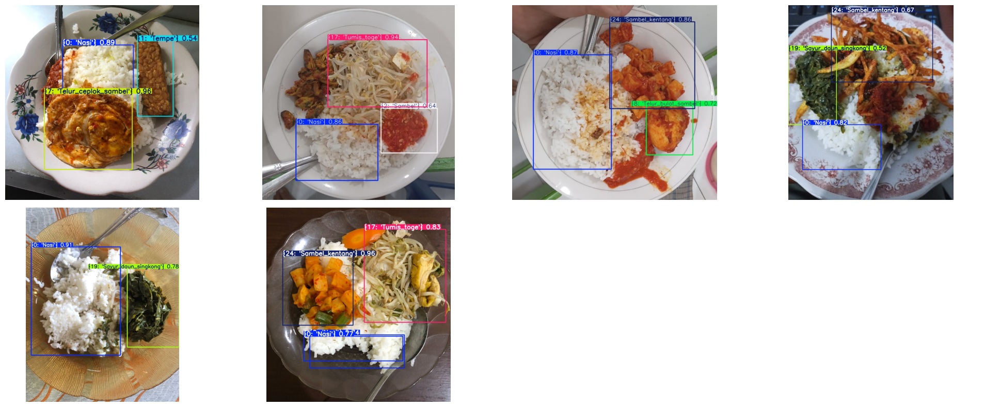

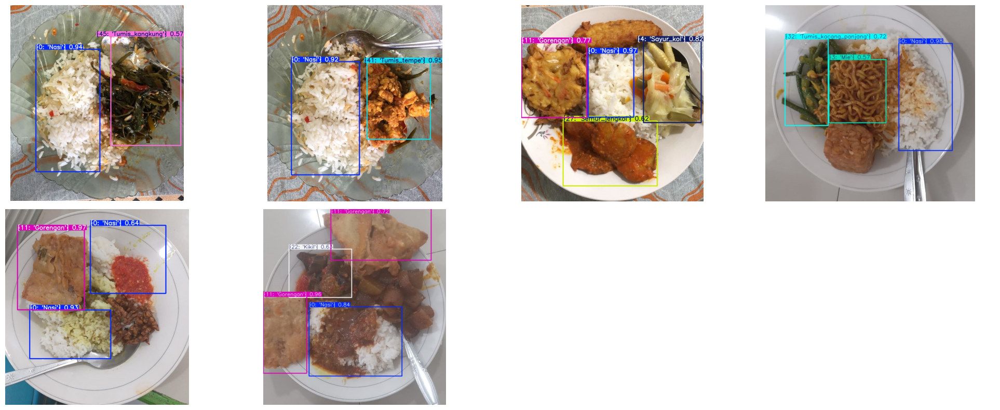

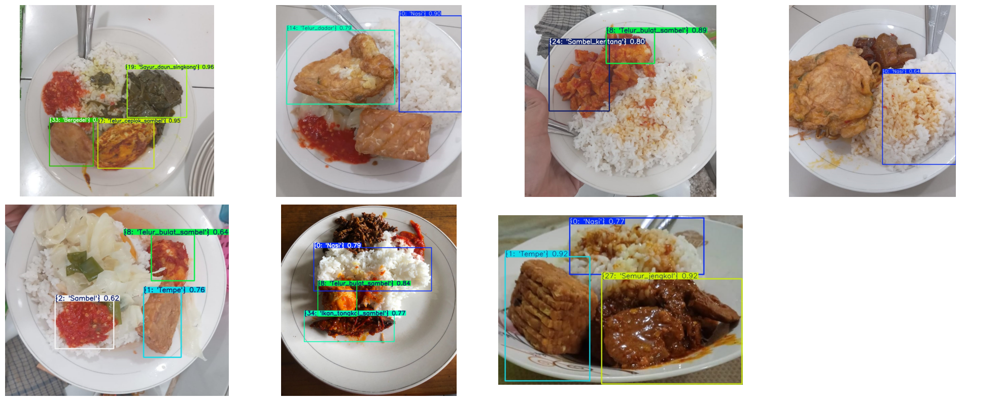

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

directory = "Predict/epochs20_batch16_lr0.001/predict"

files = os.listdir(directory)
image_paths = [os.path.join(directory, file) for file in files if file.lower().endswith((".png", ".jpg", ".jpeg"))]

# Fungsi untuk memuat dan menampilkan gambar
def plot_and_save_images(image_paths, output_path):
    num_images = len(image_paths)
    cols = 4
    rows = (num_images + cols - 1) // cols  # Menghitung jumlah baris yang diperlukan

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for img_path, ax in zip(image_paths, axes):
        # Muat gambar menggunakan cv2
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Konversi dari BGR ke RGB (opencv menggunakan BGR secara default)

        ax.imshow(img)
        ax.axis("off")

    # Nonaktifkan sumbu untuk kotak kosong
    for ax in axes[num_images:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

    # Simpan gambar hasil prediksi dalam satu file
    fig.savefig(output_path, bbox_inches="tight")
    plt.close(fig)  # Tutup figure setelah menyimpannya

# Bagi path gambar menjadi tiga bagian
split_size = len(image_paths) // 3
image_paths1 = image_paths[:split_size]
image_paths2 = image_paths[split_size:2*split_size]
image_paths3 = image_paths[2*split_size:]

# Panggil fungsi plot_and_save_images untuk menampilkan dan menyimpan gambar dalam tiga file terpisah
plot_and_save_images(image_paths1, output_path="combined_image_part1.jpg")
plot_and_save_images(image_paths2, output_path="combined_image_part2.jpg")
plot_and_save_images(image_paths3, output_path="combined_image_part3.jpg")

# Hasil Prediksi Citra dan Harga

In [5]:
import cv2
import os
import random
from ultralytics import YOLO

model = YOLO("runs/detect/train4/weights/best.pt")
image_folder = "dataset/test/images"

display_width = 500
display_height = 500

image_files = [
    os.path.join(image_folder, f)
    for f in os.listdir(image_folder)
    if f.lower().endswith((".png", ".jpg", ".jpeg"))
]

if not image_files:
    print("Tidak ada gambar ditemukan di folder.")
    exit()

confidence_threshold = 0.30
iou_threshold = 0.5

colors = [
    (255, 0, 0),  # Blue
    (0, 255, 0),  # Green
    (0, 0, 255),  # Red
    (255, 255, 0),  # Cyan
    (255, 0, 255),  # Magenta
    (0, 255, 255),  # Yellow
]

labels = [
    "Nasi", "Tempe", "Sambel", "Mie", "Sayur_kol", "Tempe_orek", "Telur_ceplok", "Telur_ceplok_sambel",
    "Telur_bulat_sambel", "Tumis_oncom_cepokak", "Sayur_timun", "Gorengan", "Sambel_tempe", "Sayur_bayam",
    "Telur_dadar", "Rawon", "Kerang", "Tumis_toge", "Ikan_kembung", "Sayur_daun_singkong", "Ayam_sambel",
    "Sambel_terong", "Kikil", "Tumis_tempe_cepokak", "Sambel_kentang", "Teri", "Tumis_toge_kacang_panjang",
    "Semur_jengkol", "Capcai", "Tumis_labu_wortel", "Tumis_pare", "Kwetiau", "Tumis_kacang_panjang",
    "Bergedel", "Ikan_tongkol_sambel", "Sayur_labu", "Tumis_jamur", "Sayur_sawi", "Tumis_tempe_buncis",
    "Sayur_nangka", "Ikan_patin", "Tumis_tempe", "Tumis_kangkung_buncis", "Ati_ampela", "Ayam_kecap",
    "Tumis_kangkung", "Sayur_sawi_jagung", "Sayur_bambu", "Ikan_asin", "Tumis_toge_genjer",
    "Ikan_kembung_sambel", "Tumis_jagung", "Sayur_buncis", "Usus", "Sayur_tahu_kacang_panjang", "Tumis_tahu",
    "Tumis_oncom", "Tumis_sawi", "Ikan_patin_sambel", "Sayur_kacang_panjang", "Sayur_kentang",
    "Ikan_patin_sayur", "Rendang_daging", "Kentang", "Bihun", "Telur_bulat", "Tumis_buncis_wortel",
    "Ayam_sayur_kentang", "Tumis_kentang_buncis", "Tumis_buncis", "Tahu", "Sayur_tempe_kentang",
    "Sayur_kentang_wortel", "Tumis_kangkung_tempe", "Tumis_kol_bayam", "Telur_sambel", "Ayam_sayur",
    "Sambel_tongkol_kentang", "Telur_tempe_kecap", "Pepes_tahu", "Tumis_daun_pepaya", "Tumis_bunga_pepaya",
    "Tumis_tahu_terong", "Tumis_jamur_buncis", "Tumis_terong", "Tumis_tempe_kacang_panjang", "Sambel_ceker",
    "Sayur_tempe", "Sayur_tahu_toge", "Kacang_panjang", "Ikan_bawal", "Tumis_toge_tahu", "Daun_kangkung",
    "Semur_telur_bulat_tempe", "Tumis_kentang_kacang_panjang", "Tumis_toge_wortel"
]

prices = [
    5000, 2000, 1000, 3000, 3000, 4000, 5000, 5500, 6000, 4500, 
    3000, 2000, 4000, 3000, 6000, 10000, 7000, 4000, 8000, 3500, 
    12000, 4500, 10000, 5000, 6000, 5500, 4500, 9000, 6500, 5000, 
    5500, 8000, 5000, 3000, 8500, 4000, 7000, 4000, 5500, 5000,
    12000,4500, 5000, 8500, 12000, 5000, 4500, 4000, 5000, 5500, 
    8500, 4500, 4000, 7000, 5000, 4500, 5000, 4500, 12500, 4500, 
    5500, 13000, 15000, 4500, 5000, 5500, 12500, 5500, 5000, 2500, 
    5500, 5500, 5500, 5500, 6000, 11500, 9000, 6000, 5000, 5000, 
    5500, 6000, 5000, 5500, 7500, 4500, 5000, 4500, 10000, 5500, 
    3500, 7500, 5500, 5500
]

for image_path in image_files:
    image = cv2.imread(image_path)
    if image is None:
        continue

    results = model(image, conf=confidence_threshold)
    boxes = results[0].boxes.xyxy.cpu().numpy()
    confidences = results[0].boxes.conf.cpu().numpy()
    classes = results[0].boxes.cls.cpu().numpy()

    total_price = 0
    detected_items = []
    for i in range(len(boxes)):
        x1, y1, x2, y2 = map(int, boxes[i])
        class_id = int(classes[i])
        label = f"{labels[class_id]}: Rp.{prices[class_id]}"
        detected_items.append(label)
        total_price += prices[class_id]
        color = colors[class_id % len(colors)]
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    cv2.putText(image, f"Total: Rp.{total_price}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
    image_resized = cv2.resize(image, (display_width, display_height))
    cv2.imshow("Detection", image_resized)
    if cv2.waitKey(0) & 0xFF == ord("q"):
        break

cv2.destroyAllWindows()


0: 480x640 1 {0: 'Nasi'}, 1 {7: 'Telur_ceplok_sambel'}, 1 {34: 'Ikan_tongkol_sambel'}, 167.6ms
Speed: 11.8ms preprocess, 167.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 {0: 'Nasi'}, 2 {24: 'Sambel_kentang'}s, 199.8ms
Speed: 10.7ms preprocess, 199.8ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 {0: 'Nasi'}, 1 {1: 'Tempe'}, 1 {3: 'Mie'}, 177.6ms
Speed: 13.6ms preprocess, 177.6ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 200.9ms
Speed: 7.0ms preprocess, 200.9ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 170.4ms
Speed: 10.0ms preprocess, 170.4ms inference, 15.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 187.9ms
Speed: 4.0ms preprocess, 187.9ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 177.8ms
Speed: 13.5ms preprocess, 177.8ms in

# Real-Time 

In [4]:
# import cv2
# from ultralytics import YOLO

# model = YOLO("runs/detect/train4/weights/best.pt") 

# cap = cv2.VideoCapture(0) 

# if not cap.isOpened():
#     print("Tidak dapat mengakses kamera.")
#     exit()

# while True:
#     ret, frame = cap.read()
#     if not ret:
#         print("Gagal membaca frame dari kamera.")
#         break

#     results = model(frame)

#     totals = 0 
#     for result in results:
#         for box, conf, cls in zip(result.boxes.xyxy, result.boxes.conf, result.boxes.cls):
#             x1, y1, x2, y2 = map(int, box)
#             class_id = int(cls)
#             label = labels[class_id]
#             price = prices[class_id] 
#             totals += price 
#             color = colors[class_id % len(colors)]
#             cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
#             text = f"{label} Rp. {price}"
#             cv2.putText(frame, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

#     cv2.putText(frame, f"Total Rp. {totals}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
#     cv2.imshow("Real-Time Detection", frame)

#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break

# cap.release()
# cv2.destroyAllWindows()